In [15]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import geopandas as gpd
from matplotlib import colors

%matplotlib inline
import re

from matplotlib import style
style.use('ggplot')
from textblob import TextBlob
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))
from wordcloud import WordCloud
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay


# Total Greenhouse Gas Emissions

In [269]:
# In this section we displayed the total greenhouse emissions of some countries.

In [270]:
total_ghg = pd.read_csv('total-ghg-emissions.csv')
total_ghg

,Entity,Code,Year,Total including LUCF
0,Afghanistan,AFG,1990,9.580000e+06
1,Afghanistan,AFG,1991,9.810000e+06
2,Afghanistan,AFG,1992,9.030000e+06
3,Afghanistan,AFG,1993,9.110000e+06
4,Afghanistan,AFG,1994,9.150000e+06
...,...,...,...,...
6144,Zimbabwe,ZWE,2015,4.230000e+07
6145,Zimbabwe,ZWE,2016,1.159200e+08
6146,Zimbabwe,ZWE,2017,1.155900e+08
6147,Zimbabwe,ZWE,2018,1.182200e+08


In [271]:
total_ghg.rename(columns = {'Total including LUCF':'Total'}, inplace = True) 

In [272]:
total_ghg = total_ghg[total_ghg["Entity"] != "World"]
total_ghg = total_ghg[total_ghg["Entity"] != "Asia"]
total_ghg = total_ghg[total_ghg["Entity"] != "Europe"]
total_ghg = total_ghg[total_ghg["Entity"] != "North America"]
total_ghg = total_ghg[total_ghg["Entity"] != "South America"]
total_ghg = total_ghg[total_ghg["Entity"] != "European Union (27)"]
total_ghg = total_ghg[total_ghg["Entity"] != "Upper-middle-income countries"]
total_ghg = total_ghg[total_ghg["Entity"] != "High-middle-income countries"]
total_ghg = total_ghg[total_ghg["Entity"] != "High-income countries"]
total_ghg = total_ghg[total_ghg["Entity"] != "Low-income countries"]
total_ghg = total_ghg[total_ghg["Entity"] != "Lower-middle-income countries"]
# Since we only want the countries, we get rid of communities like European Union etc.

<AxesSubplot: title={'center': 'Total Greenhouse Gas Emission of Some Countries Through The Years'}, xlabel='Year'>

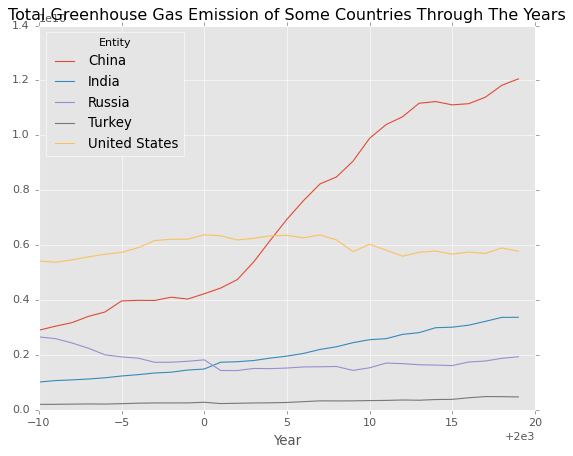

In [273]:
country_ghg = total_ghg.loc[(total_ghg.values == 'Turkey') | (total_ghg.values == 'China') | (total_ghg.values == 'United States') | (total_ghg.values == 'Russia')| (total_ghg.values == 'India')]
country_plot = country_ghg.pivot(index='Year',columns='Entity',values='Total')
country_plot.plot.line(title='Total Greenhouse Gas Emission of Some Countries Through The Years')

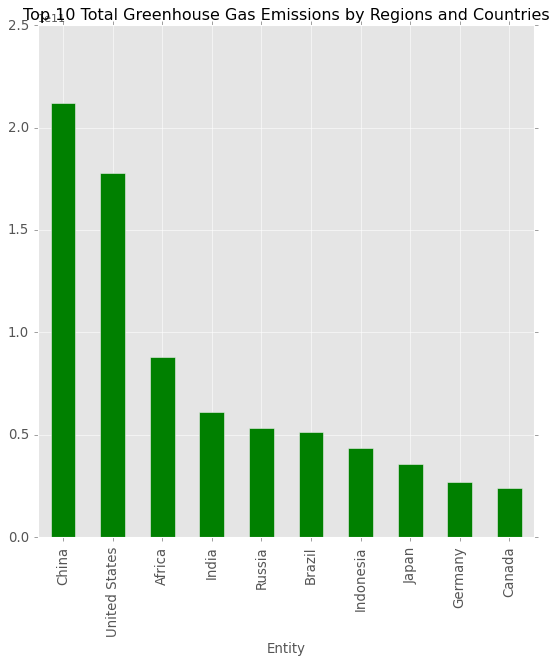

In [266]:
total_ghg = total_ghg.groupby('Entity')
sum_t = total_ghg['Total'].sum()
sum_t_sorted = sum_t.sort_values(ascending=False)
sum_t_sorted
sum_t_sorted.head(10).plot(title ='Top 10 Total Greenhouse Gas Emissions by Regions and Countries' ,kind='bar',figsize=(8,8),fontsize=12,color="Green");

In [234]:
# Gas Types

In [235]:
# In this section, we worked on gas types of total emissions.

In [104]:
gas_types = pd.read_csv('gas-types.csv')

In [105]:
gas_types = gas_types.groupby('Gas').sum()

Text(0.5, 1.0, 'Breakdown of Global Gas Emissions by Types in 2019')

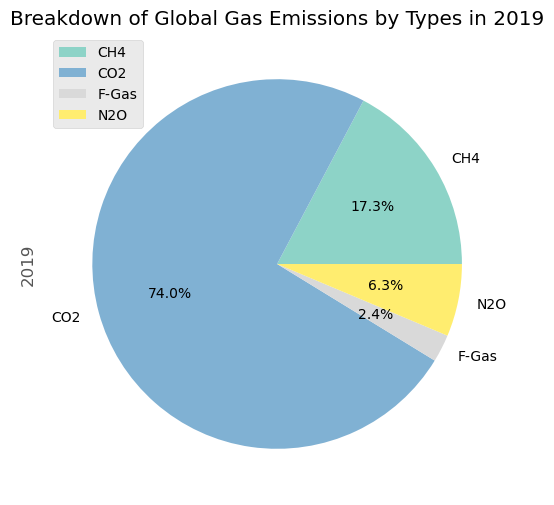

In [106]:
gas_types.plot(kind='pie',y='2019',autopct='%1.1f%%',figsize=(6,6),colormap='Set3');
plt.title("Breakdown of Global Gas Emissions by Types in 2019")

In [107]:
df_global_greenhousegas = pd.read_csv('data_clean.csv', delimiter=';')

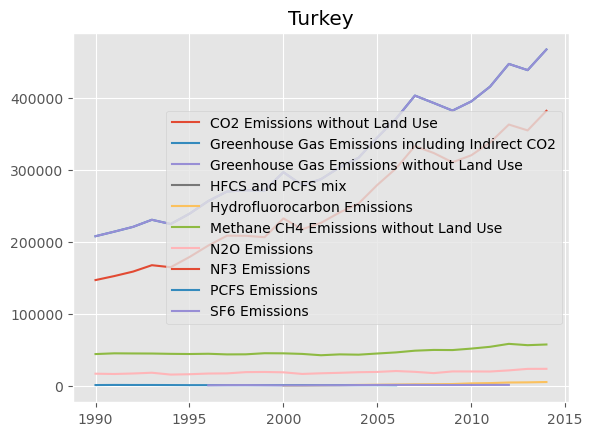

<Figure size 2000x600 with 0 Axes>

In [108]:
table = pd.pivot_table(df_global_greenhousegas, values='value', index=['country_or_area', 'year'], columns=['category'])
gasnames = table.columns.values
def country_plot(nameOfCountry):
    data = table.loc[nameOfCountry]
    plt.plot(data)
    plt.legend(gasnames)
    plt.title(nameOfCountry)
    plt.figure(figsize=(20,6))
    
country_plot('Turkey')

In [109]:
data_co2_gases = df_global_greenhousegas[df_global_greenhousegas["category"]=="CO2 Emissions without Land Use"]

Text(0.5, 1.0, ' Amount of CO2 Gases from 1980 to 2014 ')

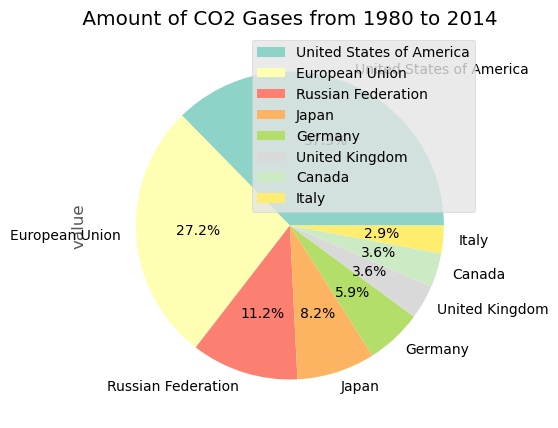

In [110]:
country_CO2gases_values = data_co2_gases.groupby(by="country_or_area").sum().sort_values(by='value',ascending=False)
country_CO2gases_values = country_CO2gases_values.drop(['year',],axis=1)
country_CO2gases_values =country_CO2gases_values.head(8)
country_CO2gases_values.plot(kind='pie',autopct='%1.1f%%',figsize=(5,5),colormap='Set3',subplots=True);
plt.title(" Amount of CO2 Gases from 1980 to 2014 ")

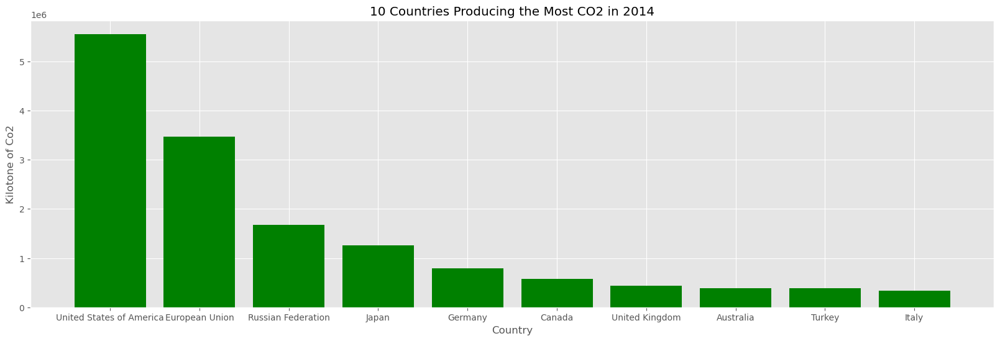

In [111]:
data_co2_gases_1= data_co2_gases.drop(["category"],axis=1)
data_co2_gases_1=data_co2_gases_1[(data_co2_gases_1["year"]==2014)]
data_co2_gases_1=data_co2_gases_1.sort_values(by='value',ascending=False)
data_co2_gases_1= data_co2_gases_1.head(10)
X = data_co2_gases_1["country_or_area"]
Y = data_co2_gases_1["value"]
  
# Plot the data using bar() method
plt.figure(figsize=(20,6))
plt.bar(X, Y, color='g')
plt.title("10 Countries Producing the Most CO2 in 2014")
plt.xlabel("Country")
plt.ylabel("Kilotone of Co2")
# Show the plot
plt.show()


In [112]:
data_hfcs_gases = df_global_greenhousegas[df_global_greenhousegas["category"]=="Hydrofluorocarbon Emissions"]

Text(0.5, 1.0, ' Amount of HFCS Gases from 1980 to 2014 ')

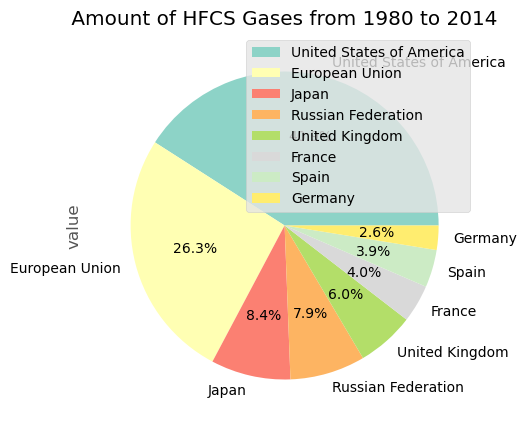

In [113]:
country_HFCSgases_values = data_hfcs_gases.groupby(by="country_or_area").sum().sort_values(by='value',ascending=False)
country_HFCSgases_values = country_HFCSgases_values.drop(['year',],axis=1)
country_HFCSgases_values =country_HFCSgases_values.head(8)
country_HFCSgases_values.plot(kind='pie',autopct='%1.1f%%',figsize=(5,5),colormap='Set3',subplots=True);
plt.title(" Amount of HFCS Gases from 1980 to 2014 ")

In [114]:
data_ch4_gases = df_global_greenhousegas[df_global_greenhousegas["category"]=="Methane CH4 Emissions without Land Use"]

Text(0.5, 1.0, ' Amount of Greenhouse CH4 Gases from 1980 to 2014 ')

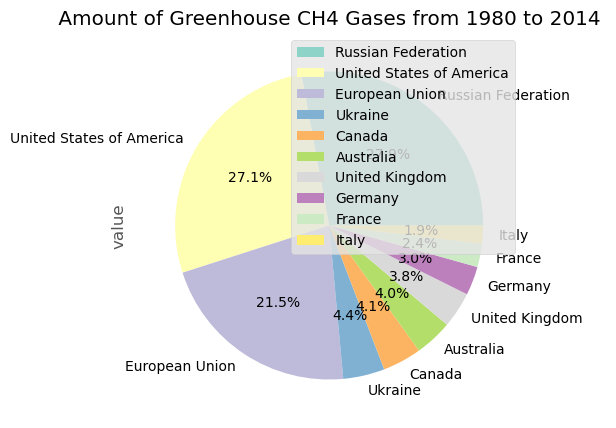

In [115]:
country_CH4gases_values = data_ch4_gases.groupby(by="country_or_area").sum().sort_values(by='value',ascending=False)
country_CH4gases_values = country_CH4gases_values.drop(['year',],axis=1)
country_CH4gases_values1 =country_CH4gases_values.head(10)
country_CH4gases_values1.plot(kind='pie',autopct='%1.1f%%',figsize=(5,5),colormap='Set3',subplots=True);
plt.title(" Amount of Greenhouse CH4 Gases from 1980 to 2014 ")


In [116]:
data_nf3_gases = df_global_greenhousegas[df_global_greenhousegas["category"]=="NF3 Emissions"]

Text(0.5, 1.0, ' Amount of Greenhouse NF3 Gases from 1980 to 2014 ')

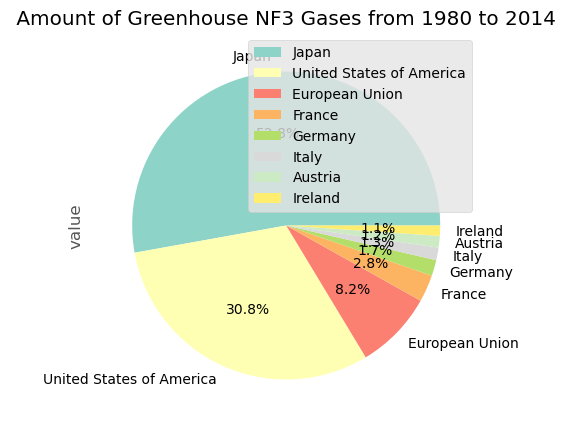

In [117]:
country_NF3gases_values = data_nf3_gases.groupby(by="country_or_area").sum().sort_values(by='value',ascending=False)
country_NF3gases_values = country_NF3gases_values.drop(['year',],axis=1)
country_NF3gases_values =country_NF3gases_values.head(8)
country_NF3gases_values.plot(kind='pie',autopct='%1.1f%%',figsize=(5,5),colormap='Set3',subplots=True);
plt.title(" Amount of Greenhouse NF3 Gases from 1980 to 2014 ")


In [118]:
data_n2o_gases = df_global_greenhousegas[df_global_greenhousegas["category"]=="N2O Emissions"]

Text(0.5, 1.0, ' Amount of N2O Gases from 1980 to 2014 ')

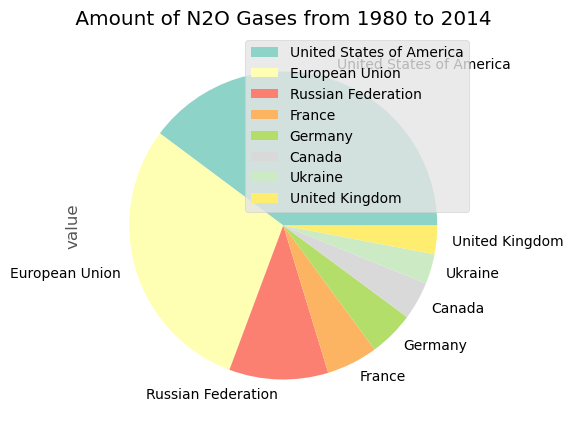

In [119]:
country_N2Ogases_values = data_n2o_gases.groupby(by="country_or_area").sum().sort_values(by='value',ascending=False)
country_N2Ogases_values = country_N2Ogases_values.drop(['year',],axis=1)
country_N2Ogases_values =country_N2Ogases_values.head(8)
country_N2Ogases_values.plot(kind='pie',figsize=(5,5),colormap='Set3',subplots=True);
plt.title(" Amount of N2O Gases from 1980 to 2014 ")

In [120]:
data_pfcs_gases = df_global_greenhousegas[df_global_greenhousegas["category"]=="PCFS Emissions"]

Text(0.5, 1.0, ' Amount of Greenhouse PFCS Gases from 1980 to 2014 ')

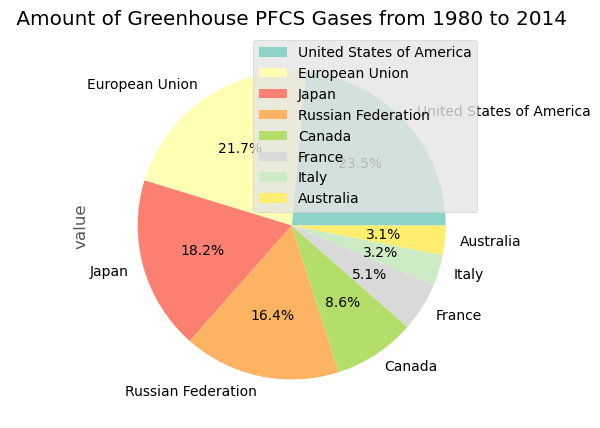

In [121]:
country_PFCSgases_values = data_pfcs_gases.groupby(by="country_or_area").sum().sort_values(by='value',ascending=False)
country_PFCSgases_values = country_PFCSgases_values.drop(['year',],axis=1)
country_PFCSgases_values =country_PFCSgases_values.head(8)
country_PFCSgases_values.plot(kind='pie',autopct='%1.1f%%',figsize=(5,5),colormap='Set3',subplots=True);
plt.title(" Amount of Greenhouse PFCS Gases from 1980 to 2014 ")


In [122]:
data_sf6_gases = df_global_greenhousegas[df_global_greenhousegas["category"]=="SF6 Emissions"]

Text(0.5, 1.0, ' Amount of Greenhouse SF6 Gases from 1980 to 2014 ')

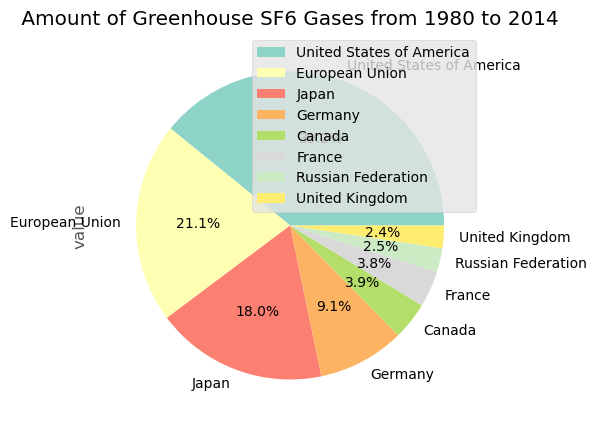

In [123]:
country_SF6gases_values = data_sf6_gases.groupby(by="country_or_area").sum().sort_values(by='value',ascending=False)
country_SF6gases_values = country_SF6gases_values.drop(['year',],axis=1)
country_SF6gases_values =country_SF6gases_values.head(8)
country_SF6gases_values.plot(kind='pie',autopct='%1.1f%%',figsize=(5,5),colormap='Set3',subplots=True);
plt.title(" Amount of Greenhouse SF6 Gases from 1980 to 2014 ")

In [124]:
# Greenhouse Gases by Sector

In [125]:
# In this section, we worked on greenhouse gases by sector.

In [126]:
by_sector = pd.read_csv('by-sectors-g.csv')

In [127]:
grouped_sector = by_sector.groupby('Sector').sum()
grouped_sector

,2019,2018,2017,2016,2015,2014,2013,2012,2011,2010,...,1999,1998,1997,1996,1995,1994,1993,1992,1991,1990
Sector,,,,,,,,,,,,,,,,,,,,,
Agriculture,23932.62,23965.90,24038.05,23689.82,23507.02,23394.99,23196.26,23425.43,23320.22,22798.06,...,21238.45,21017.27,20803.32,21089.22,21005.73,20792.80,20623.85,20777.47,20915.30,20998.01
Building,13098.71,13286.72,13195.73,12938.27,12768.74,12598.95,12963.60,12492.10,12690.32,13053.81,...,12352.11,12087.78,12731.60,12888.78,12533.23,12200.64,12633.88,12353.27,12889.41,12728.95
Bunker Fuels,5616.52,5633.80,5510.61,5273.83,5086.96,4879.99,4732.38,4722.14,4917.99,4838.88,...,3646.20,3489.27,3382.38,3260.82,3158.95,3064.08,2959.66,2988.59,2838.46,2808.35
Electricity/Heat,64876.56,65257.50,63549.24,62191.56,62157.08,63208.12,63579.27,62638.88,61470.65,59079.32,...,43121.66,43001.38,42112.40,41128.20,39656.17,38867.80,38474.61,38390.14,37820.75,37292.15
Energy,152376.00,152482.89,149359.09,147079.50,147103.86,147486.62,147489.81,145163.24,143561.08,139944.49,...,105723.56,105413.85,104782.66,103331.18,101148.93,98505.11,98166.33,97734.68,98327.73,97932.89
Fugitive Emissions,13337.25,13143.41,12698.11,12534.68,12581.33,12594.81,12447.96,12414.86,12213.07,11901.93,...,9216.87,9233.77,9192.69,9147.50,8901.76,8634.21,8580.54,8518.80,8530.20,8537.48
Industrial Processes,12531.91,12190.82,11749.64,11484.72,11082.96,11125.41,10627.29,10171.22,9848.19,9240.91,...,5717.26,5705.54,5727.70,5551.44,5334.66,5025.77,4568.03,4514.14,4323.91,4323.74
Land-Use Change and Forestry,6097.50,5080.88,4411.24,4600.17,1991.37,1797.31,398.61,576.25,464.29,5330.06,...,6724.31,7489.44,10169.77,6289.64,7104.86,7081.22,7081.33,7081.34,7081.45,7081.48
Manufacturing/Construction,25831.55,25558.36,25151.00,25378.90,26120.16,26452.45,26291.75,26189.35,26120.09,25208.64,...,15811.12,16496.27,16553.74,16455.33,16903.37,15962.72,15866.25,16100.50,16746.93,17192.24


Text(0.5, 1.0, 'Global Greenhouse Gas Emissions by Sector in 2019')

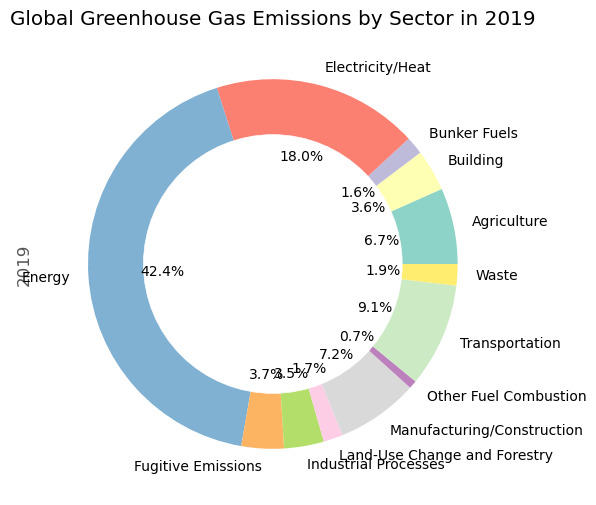

In [128]:
grouped_sector['2019'].plot(kind='pie',y='2019',autopct='%1.1f%%',figsize=(6,6),colormap='Set3')

my_circle=plt.Circle( (0,0), 0.7, color='white')
p=plt.gcf()
p.gca().add_artist(my_circle)

plt.title("Global Greenhouse Gas Emissions by Sector in 2019")

In [129]:
# In this section, we created a heatmap for Greenhouse Gas Emissions.

In [130]:
data_total_gases = df_global_greenhousegas[df_global_greenhousegas["category"]=="Greenhouse Gas Emissions including Indirect CO2"]

In [131]:
meanvalue=data_total_gases['value'].mean()
meanvalue

587410.6051461811

In [132]:
max_value=data_total_gases['value'].max()
max_value

7422207.96295139

/var/folders/m0/8czfd05s5ssg7l7lp2fvr4040000gn/T/ipykernel_801/3225936696.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Text(0.5, 1.0, 'Heatmap for Greenhouse Gas Emissions Globally')

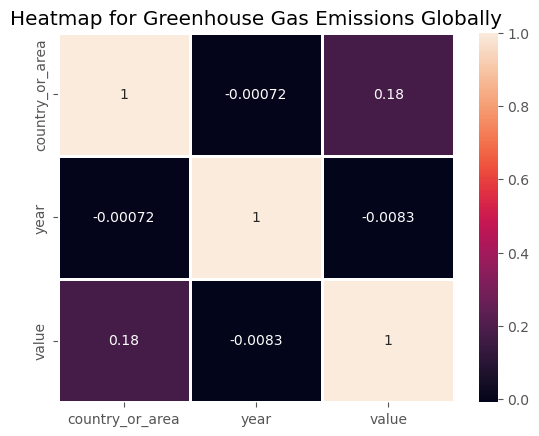

In [133]:
data_total_gases['country_or_area'] = (data_total_gases['country_or_area'].astype('category')).cat.codes
sns.heatmap(data_total_gases[["country_or_area","year","value","category"]].corr(),annot=True, linewidth=1)
plt.title("Heatmap for Greenhouse Gas Emissions Globally")

In [134]:
# CO2 Emissions of the World, in 2018

In [135]:
co2 = pd.read_csv("v50_2018.txt", delimiter=';')

In [136]:
co2 = co2.sort_values('emission', ascending=False)

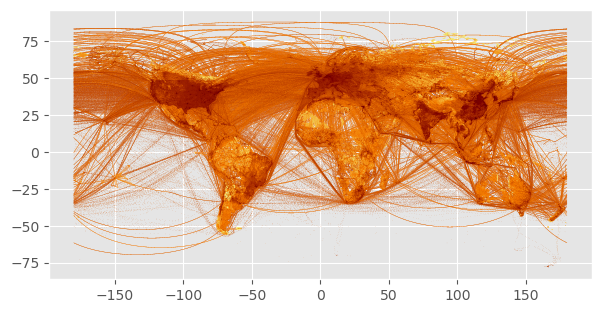

In [137]:
fig = plt.figure()
fig.set_size_inches(7, 3.5)
plt.scatter(co2['lon'], co2['lat'], s=0.05, edgecolors='none', c=co2['emission'], norm=colors.LogNorm(), cmap='afmhot_r')
plt.show()

In [138]:
# Annual CO2 Emissions by Region

In [139]:
# In this section, we worked on displaying the CO2 values of the world in an interactive way with an animated graph
# and also a world map.

In [1]:
import pandas as pd
import folium
import geopandas
from folium import plugins
import plotly.express as px

In [2]:
df_annual = pd.read_csv("annual-co-emissions-by-region.csv")

In [3]:
df_annual = df_annual.replace(["United States"], ["United States of America"])

In [4]:
map_world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))
x = map_world.merge(df_annual, how="left", left_on=['name'], right_on=['Entity'])
x=x.dropna()
x["Year"] = x["Year"].astype(int)


sorted_data = x.sort_values(by = "Annual CO2 emissions (zero filled)", ascending = False)

fig = px.bar(sorted_data, x = "name", y = "Annual CO2 emissions (zero filled)", animation_frame = "Year",
                    color = "Annual CO2 emissions (zero filled)", color_continuous_scale = "jet")
title = "Annual CO2 Emissions"
fig.show()

In [6]:
df_2020 = df_annual[df_annual["Year"]==2020]
world_2020 = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))
table = world_2020.merge(df_2020, how="left", left_on=['name'], right_on=['Entity'])
map_2020 = folium.Map()
folium.Choropleth(
    geo_data=table,
    name='data science project',
    data=table,
    columns=['Entity', 'Annual CO2 emissions (zero filled)'],
    key_on='feature.properties.name',
    nan_fill_color='white',
    fill_color='Spectral',
    fill_opacity=0.5,
    line_opacity=0.2,
    legend_name='Annual CO2 emissions',
    animation_frame = "Year"
).add_to(map_2020)


folium.LayerControl(collapsed=False).add_to(map_2020)
display(map_2020)

In [292]:
# Temperatures

In [293]:
# In this section, we worked with global land temperatures by country.

In [144]:
df_global_temp = pd.read_csv('GlobalLandTemperaturesByCountry.csv')
display(df_global_temp)

,dt,AverageTemperature,AverageTemperatureUncertainty,Country
0,1743-11-01,4.384,2.294,Åland
1,1743-12-01,NaN,NaN,Åland
2,1744-01-01,NaN,NaN,Åland
3,1744-02-01,NaN,NaN,Åland
4,1744-03-01,NaN,NaN,Åland
...,...,...,...,...
577457,2013-05-01,19.059,1.022,Zimbabwe
577458,2013-06-01,17.613,0.473,Zimbabwe
577459,2013-07-01,17.000,0.453,Zimbabwe
577460,2013-08-01,19.759,0.717,Zimbabwe


In [145]:
df_global_temp = df_global_temp[df_global_temp['dt'] >"1900-12-01"] 

In [146]:
missingsum=df_global_temp.isnull().sum()
missingsum

dt                                  0
AverageTemperature               1028
AverageTemperatureUncertainty     289
Country                             0
dtype: int64

In [147]:
df_global_temp[df_global_temp['AverageTemperature'].isnull()]

,dt,AverageTemperature,AverageTemperatureUncertainty,Country
3238,2013-09-01,NaN,NaN,Åland
5344,2013-09-01,NaN,NaN,Afghanistan
7309,2013-09-01,NaN,NaN,Africa
10548,2013-09-01,NaN,NaN,Albania
13269,2013-09-01,NaN,NaN,Algeria
...,...,...,...,...
566880,2013-09-01,NaN,NaN,Vietnam
571878,2013-09-01,NaN,NaN,Western Sahara
573531,2013-09-01,NaN,NaN,Yemen
575496,2013-09-01,NaN,NaN,Zambia


In [148]:
df_global_temp[df_global_temp['AverageTemperatureUncertainty'].isnull()]

,dt,AverageTemperature,AverageTemperatureUncertainty,Country
3238,2013-09-01,NaN,NaN,Åland
5344,2013-09-01,NaN,NaN,Afghanistan
7309,2013-09-01,NaN,NaN,Africa
10548,2013-09-01,NaN,NaN,Albania
13269,2013-09-01,NaN,NaN,Algeria
...,...,...,...,...
566880,2013-09-01,NaN,NaN,Vietnam
571878,2013-09-01,NaN,NaN,Western Sahara
573531,2013-09-01,NaN,NaN,Yemen
575496,2013-09-01,NaN,NaN,Zambia


In [149]:
df_global_temp=df_global_temp.dropna() 

In [150]:
countries = df_global_temp.Country.unique();

In [151]:
max_temp =df_global_temp["AverageTemperature"].max()
print("max temp on the world: " ,max_temp)
min_temp =df_global_temp["AverageTemperature"].min()
print("Min temp on the world: ",min_temp)

max temp on the world:  38.84200000000001
Min temp on the world:  -37.177


In [152]:
data_turkey=df_global_temp[df_global_temp["Country"]=="Turkey"]
data_turkey=data_turkey.dropna()

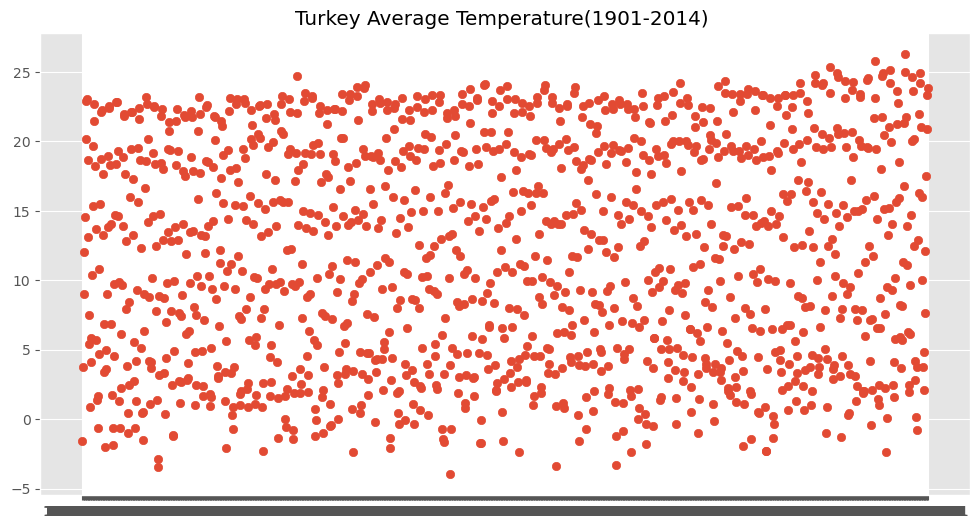

In [153]:
plt.figure(figsize=(12,6))
x=data_turkey["dt"]
y=data_turkey["AverageTemperature"]

plt.scatter(x,y) 
plt.title("Turkey Average Temperature(1901-2014) ")
plt.show()

In [154]:
def clean_df(df_global_temp): # Cleaning the data set. 
    return (df_global_temp
        .assign(
            dt= lambda df_: pd.to_datetime(df_['dt']) # cast to to datetime
        )
        .loc[(df_global_temp['Country'] == 'Turkey') & (df_global_temp['dt'] >= '1900-01-01')] # filter to Turkey after year 1900
        .drop(columns= ['AverageTemperatureUncertainty', 'Country']) # drop unused col
        .set_index('dt') # set dt as index
        .resample('MS') 
        .interpolate(motehod= 'time') # interpolate missing temperature
    )

In [155]:
df_clean= clean_df(df_global_temp)

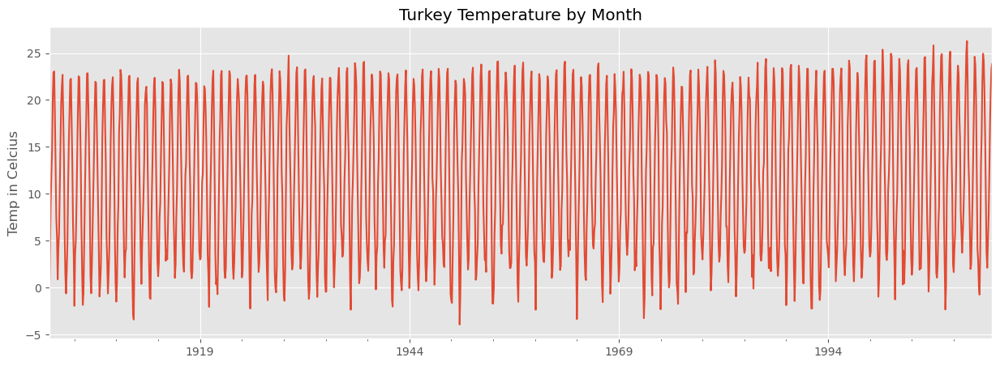

In [156]:
(df_clean
    .plot(
        figsize= (15, 5),
        style= '-',
        title= 'Turkey Temperature by Month',
        legend= False,
        xlabel= '',
        ylabel= 'Temp in Celcius'
    )
)

plt.show()

In [157]:
country_temp_values = df_global_temp.groupby(by="Country").agg(["min","mean","max"])
country_temp_values

/var/folders/m0/8czfd05s5ssg7l7lp2fvr4040000gn/T/ipykernel_801/762425122.py:1: FutureWarning:

['dt'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.



AverageTemperature                     \
                              min       mean     max   
Country                                                
Afghanistan                -4.553  14.230083  28.533   
Africa                     19.794  24.244491  27.126   
Albania                    -2.049  12.884360  25.474   
Algeria                     9.591  23.269780  35.829   
American Samoa             24.712  26.723468  28.543   
...                           ...        ...     ...   
Western Sahara             14.247  22.586655  30.092   
Yemen                      18.928  26.332669  32.737   
Zambia                     15.523  21.400075  26.282   
Zimbabwe                   14.079  21.247640  26.601   
Åland                     -12.097   5.671036  19.858   

               AverageTemperatureUncertainty                   
                                         min      mean    max  
Country                                                        
Afghanistan                            0.128  0.492732  1.888  
Africa                                 0.077  0.233043  0.720  
Albania                                0.091  0.429054  1.966  
Algeria                                0.187  0.514786  1.910  
American Samoa                         0.071  0.480027  1.972  
...                                      ...       ...    ...  
Western Sahara                         0.139  0.632012  2.874  
Yemen                                  0.236  0.806695  3.205  
Zambia                                 0.084  0.456538  2.877  
Zimbabwe                               0.094  0.363933  4.372  
Åland                                  0.143  0.462621  1.639  

[242 rows x 6 columns]

In [158]:
# In this section, we worked on global temperatures.

In [159]:
df_global_temp_2 = pd.read_csv('GlobalTemperatures.csv')
df_global_temp_2 = df_global_temp_2[df_global_temp_2['dt'] >"2/1/1900"] 
df_global_temp_2

,dt,LandAverageTemperature,LandAverageTemperatureUncertainty,LandMaxTemperature,LandMaxTemperatureUncertainty,LandMinTemperature,LandMinTemperatureUncertainty,LandAndOceanAverageTemperature,LandAndOceanAverageTemperatureUncertainty
1802,3/1/1900,5.492,0.261,11.377,0.327,-0.680,0.610,14.400,0.141
1803,4/1/1900,8.223,0.292,13.972,0.342,2.131,0.394,15.170,0.151
1804,5/1/1900,11.385,0.357,17.415,0.329,5.179,0.379,15.955,0.159
1805,6/1/1900,13.293,0.282,19.434,0.443,7.112,0.288,16.515,0.147
1806,7/1/1900,14.171,0.345,19.897,0.372,8.095,0.311,16.785,0.154
...,...,...,...,...,...,...,...,...,...
3184,5/1/2015,12.312,0.081,18.181,0.117,6.313,0.153,16.774,0.058
3185,6/1/2015,14.505,0.068,20.364,0.133,8.627,0.168,17.390,0.057
3186,7/1/2015,15.051,0.086,20.904,0.109,9.326,0.225,17.611,0.058
3187,8/1/2015,14.755,0.072,20.699,0.110,9.005,0.170,17.589,0.057


In [274]:
import plotly.express as px

fig = px.line(df_global_temp_2, x = 'dt', y = 'LandAverageTemperature', title='World Land Average Temperature')
fig.show()

In [161]:
import datetime as dt
from scipy.stats import pearsonr
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

In [162]:
df_global_temp_2['Date'] = pd.to_datetime(df_global_temp_2.dt, format='%m/%d/%Y')
df_global_temp_2['Year'] = df_global_temp_2['Date'].dt.year
df_global_temp_2['Date'] = df_global_temp_2['Date'].map(dt.datetime.toordinal)

In [163]:
df = df_global_temp_2.groupby('Year')['LandAverageTemperature'].mean().reset_index()

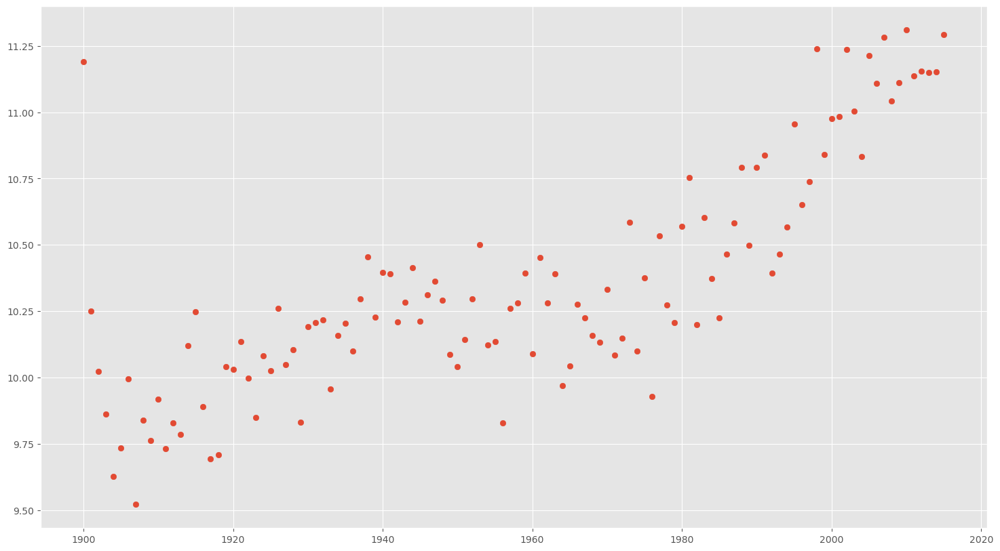

In [164]:
plt.figure(figsize=(18,10))
plt.scatter(data = df, x = 'Year',y = 'LandAverageTemperature')
plt.show()

In [165]:
# Linear Regression for Greenhouse Gases

In [166]:
from statsmodels.tsa.deterministic import DeterministicProcess

average_temperature = df_global_temp_2.groupby('Year').mean()['LandAverageTemperature']
y = average_temperature.copy() 

dp = DeterministicProcess(index=y.index, order=3)
X = dp.in_sample()
X_fore = dp.out_of_sample(steps=90)

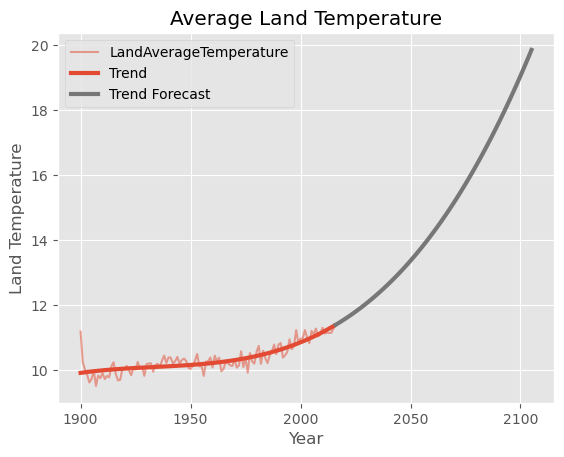

In [167]:
model = LinearRegression()

model.fit(X, y)

y_pred = pd.Series(model.predict(X), index=X.index)
y_fore = pd.Series(model.predict(X_fore), index=X_fore.index)

ax = y.plot( alpha=0.5, title="Average Land Temperature", ylabel="Land Temperature")
ax = y_pred.plot(ax=ax, linewidth=3, label="Trend", color='C0')
ax = y_fore.plot(ax=ax, linewidth=3, label="Trend Forecast", color='C3')
ax.legend();

In [168]:
# In which years did the greenhouse gas ratio hit its peak? 
# In peak years which gase has the most volume? 

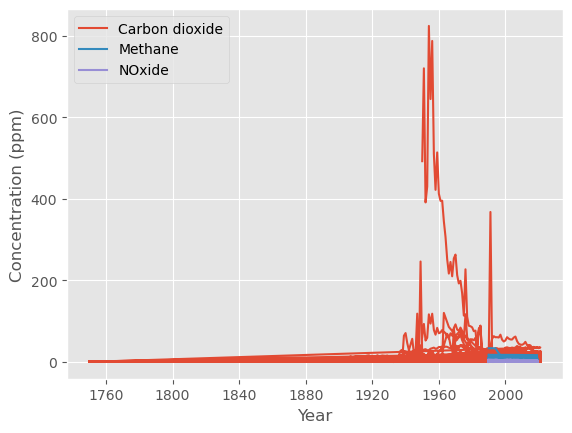

In [169]:
data = pd.read_csv("owid-co2-data.csv")

# Convert the "year" column to a datetime index
data.index = pd.to_datetime(data['year'], format='%Y')

# Plot the time series data
plt.plot(data['co2_per_capita'], label='Carbon dioxide')
plt.plot(data['methane_per_capita'], label='Methane')
plt.plot(data['nitrous_oxide_per_capita'], label='NOxide')
plt.legend()
plt.xlabel('Year')
plt.ylabel('Concentration (ppm)')
plt.show()

In [170]:
# In this section, we created a random forest for CO2, Methane and NO2

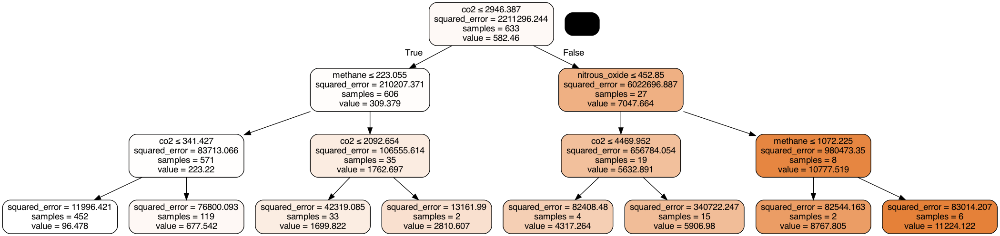

In [171]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import export_graphviz
from pydotplus import graph_from_dot_data
from sklearn.model_selection import train_test_split
import pydotplus

# Load the data into a Pandas dataframe
data = pd.read_csv("owid-co2-data.csv")

# Drop rows with any invalid values (i.e., NaN or infinity)
data = data.dropna()

# Select the features (columns) to use for prediction
features = ['co2', 'methane', 'nitrous_oxide']

# Separate the data into a training set and a test set
X_train, X_test, y_train, y_test = train_test_split(data[features], data['total_ghg'], test_size=0.2)

# Train a random forest regressor model on the training data
model = RandomForestRegressor(max_depth=3)
model.fit(X_train, y_train)

# Extract the decision tree from the random forest model
tree = model.estimators_[0]

# Export the decision tree as a Graphviz dot file
dot_data = export_graphviz(tree, out_file=None, 
                           feature_names=features,  
                           filled=True, rounded=True,  
                           special_characters=True)

# Convert the dot file to a Graphviz graph
graph = graph_from_dot_data(dot_data)

# Save the graph to a file
graph.write_png("tree.png")


from IPython.display import Image
Image(filename = 'tree.png')

In [172]:
# Tweets Analysis of Climate Change

In [320]:
# In this section, we worked on a Twitter dataset that has tweets that contain 'Climate Change' and classified
# them as positive, negative or neutral.

In [16]:
df =  pd.read_csv('twitter.csv')

In [17]:
df.head()

,sentiment,message,tweetid
0,-1,@tiniebeany climate change is an interesting h...,792927353886371840
1,1,RT @NatGeoChannel: Watch #BeforeTheFlood right...,793124211518832641
2,1,Fabulous! Leonardo #DiCaprio's film on #climat...,793124402388832256
3,1,RT @Mick_Fanning: Just watched this amazing do...,793124635873275904
4,2,"RT @cnalive: Pranita Biswasi, a Lutheran from ...",793125156185137153


In [18]:
text_df = df.drop (['sentiment', 'tweetid'], axis=1)

In [19]:
def text_process(message):
    message = message.lower()
    message = re.sub(r"https\S+|www\S+https\S+", '',message, flags=re.MULTILINE)
    message = re.sub(r'\@w+|\#','',message)
    message = re.sub(r'[^\w\s]','',message)
    message_tokens = word_tokenize(message)
    filtered_message = [w for w in message_tokens if not w in stop_words]
    return " ".join(filtered_message)

In [20]:
text_df = text_df.drop_duplicates('message')

In [21]:
stemmer = PorterStemmer()
def stemming(data):
    text = [stemmer.stem(word) for word in data]
    return data

In [22]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /Users/so/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [23]:
text_df.message = text_df['message'].apply(text_process)

In [24]:
text_df['message'] = text_df['message'].apply(lambda x: stemming(x))

In [25]:
text_df.head()

,message
0,tiniebeany climate change interesting hustle g...
1,rt natgeochannel watch beforetheflood right le...
2,fabulous leonardo dicaprios film climate chang...
3,rt mick_fanning watched amazing documentary le...
4,rt cnalive pranita biswasi lutheran odisha giv...


In [26]:
def polarity(text):
    return TextBlob(text).sentiment.polarity

In [27]:
text_df['polarity'] = text_df['message'].apply(polarity)

In [28]:
text_df.head(10)

,message,polarity
0,tiniebeany climate change interesting hustle g...,0.250000
1,rt natgeochannel watch beforetheflood right le...,0.285714
2,fabulous leonardo dicaprios film climate chang...,0.650000
3,rt mick_fanning watched amazing documentary le...,0.300000
4,rt cnalive pranita biswasi lutheran odisha giv...,0.100000
5,unamshow awache kujinga na iko global warming,0.000000
7,rt cciriviera presidential candidate donaldtru...,0.000000
8,rt americanindian8 leonardo dicaprios climate ...,0.200000
9,beforetheflood watch beforetheflood right leod...,0.285714
10,rt drdejarnett vital public health community a...,0.050000


In [29]:
def sentiment(label):
    if label <0:
        return "Negative"
    elif label ==0:
        return "Neutral"
    elif label>0:
        return "Positive"

In [30]:
text_df['sentiment'] = text_df['polarity'].apply(sentiment)

<AxesSubplot: xlabel='sentiment', ylabel='count'>

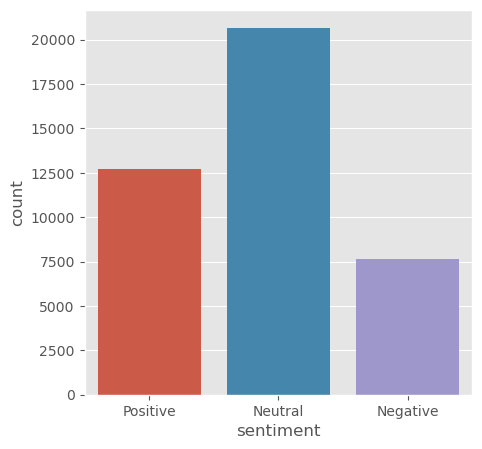

In [31]:
fig = plt.figure(figsize=(5,5))
sns.countplot(x='sentiment', data = text_df)

Text(0.5, 1.0, 'Distribution of sentiments')

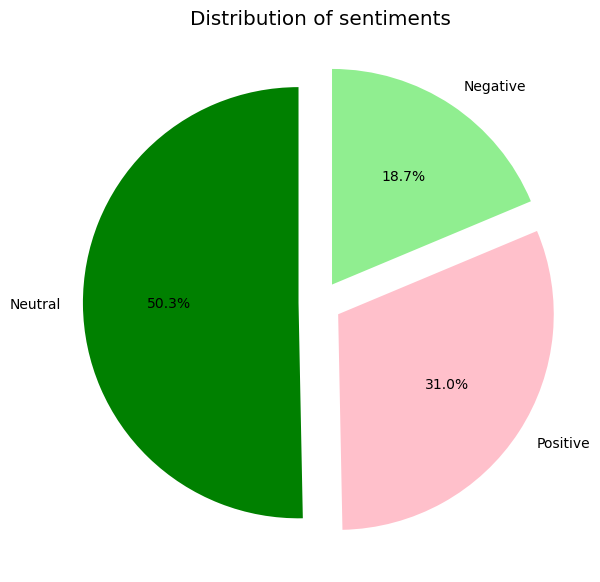

In [32]:
fig = plt.figure(figsize=(7,7))
colors = ("green", "pink", "lightgreen")
wp = {'linewidth':2, 'edgecolor':"black"}
tags = text_df['sentiment'].value_counts()
explode = (0.1,0.1,0.1)
tags.plot(kind='pie', autopct='%1.1f%%', colors = colors,
         startangle=90, explode = explode, label='')
plt.title('Distribution of sentiments')

In [33]:
positive_tweets = text_df[text_df.sentiment == 'Positive']
positive_tweets = text_df.sort_values(['polarity'], ascending= False)

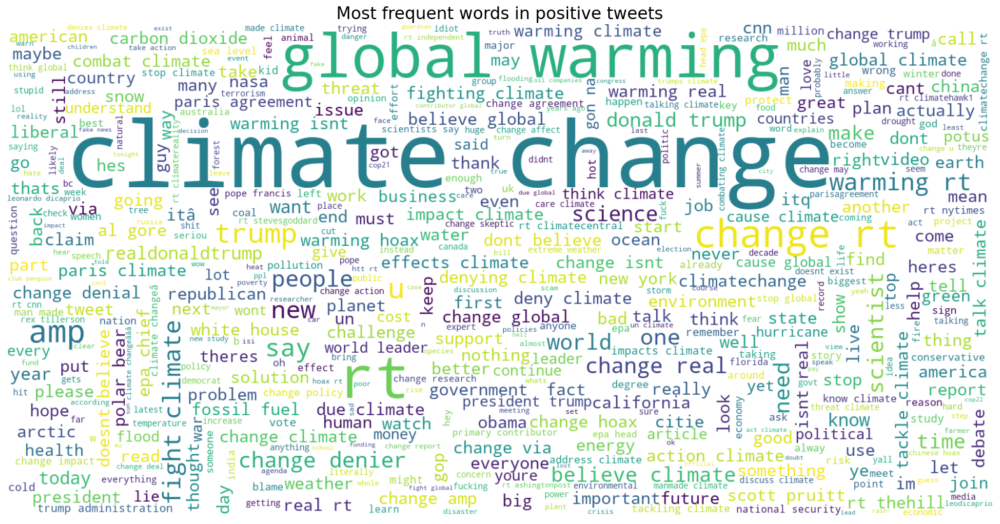

In [34]:
text = ' '.join([word for word in positive_tweets['message']])
plt.figure(figsize=(20,15), facecolor='None')
wordcloud = WordCloud(background_color='white',max_words=500, width=1600, height=800).generate(text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('Most frequent words in positive tweets', fontsize=19)
plt.show()

In [35]:
negative_tweets = text_df[text_df.sentiment == 'Negative']
negative_tweets = negative_tweets.sort_values(['polarity'], ascending= False)

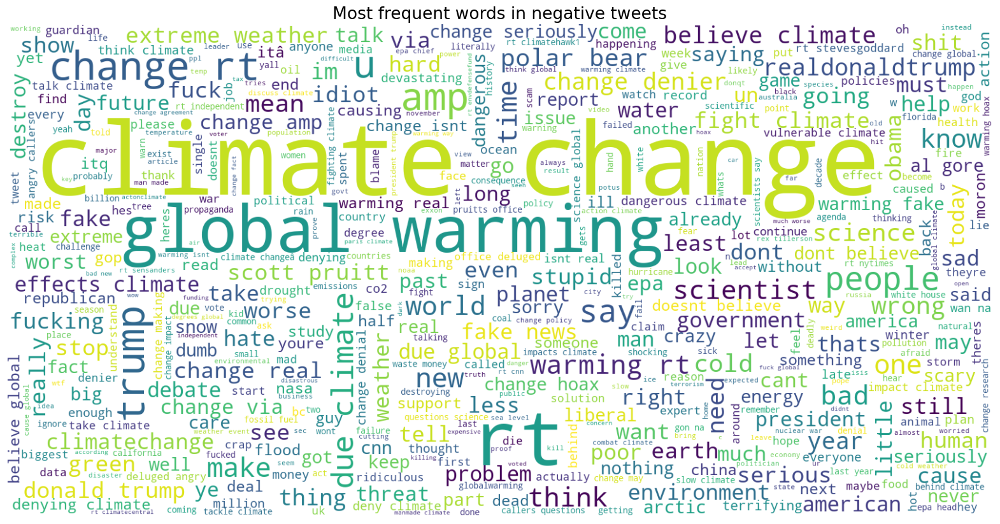

In [36]:
text = ' '.join([word for word in negative_tweets['message']])
plt.figure(figsize=(20,15), facecolor='None')
wordcloud = WordCloud(background_color='white',max_words=500, width=1600, height=800).generate(text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('Most frequent words in negative tweets', fontsize=19)
plt.show()

In [37]:
neutral_tweets = text_df[text_df.sentiment == 'Neutral']
neutral_tweets = neutral_tweets.sort_values(['polarity'], ascending= False)

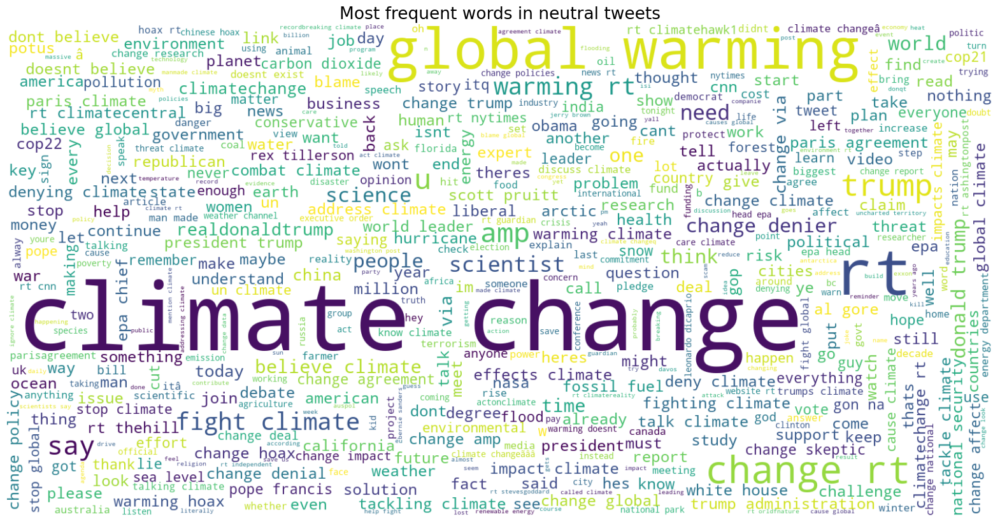

In [195]:
text = ' '.join([word for word in neutral_tweets['message']])
plt.figure(figsize=(20,15), facecolor='None')
wordcloud = WordCloud(background_color='white',max_words=500, width=1600, height=800).generate(text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('Most frequent words in neutral tweets', fontsize=19)
plt.show()

In [196]:
vect = CountVectorizer(ngram_range=(1,2)).fit(text_df['message'])

In [197]:
feature_names = vect.get_feature_names_out()
print("Number of features: {}\n".format(len(feature_names)))
print("First 20 features:\n {}".format(feature_names[:20]))

Number of features: 294379

First 20 features:
 ['000' '000 usd' '000005' '0000058' '0000058 defendscie' '0001jatt'
 '0001jatt humans' '0005c' '0005c warming' '000we' '000we need'
 '001harpinder' '001harpinder semiarid' '004' '004 change' '007'
 '009barca' '009barca madmasterr' '00kevin7' '00kevin7 manny_ottawa']


In [198]:
X = text_df['message']
Y = text_df['sentiment']
X = vect.transform(X)

In [199]:
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

In [200]:
print("Size of x_train:", (x_train.shape))
print("Size of y_train:", (y_train.shape))
print("Size of x_test:", (x_test.shape))
print("Size of y_test:", (y_test.shape))

Size of x_train: (32826, 294379)
Size of y_train: (32826,)
Size of x_test: (8207, 294379)
Size of y_test: (8207,)


In [201]:
logreg = LogisticRegression()
logreg.fit(x_train, y_train)
logreg_pred = logreg.predict(x_test)
logreg_acc = accuracy_score(logreg_pred, y_test)
print("Test accuracy: {:.2f}%".format(logreg_acc*100))

Test accuracy: 90.75%


/Users/so/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [202]:
print(confusion_matrix(y_test, logreg_pred))
print("\n")
print(classification_report(y_test, logreg_pred))

[[1135  260  113]
 [  13 4145   22]
 [  54  297 2168]]


              precision    recall  f1-score   support

    Negative       0.94      0.75      0.84      1508
     Neutral       0.88      0.99      0.93      4180
    Positive       0.94      0.86      0.90      2519

    accuracy                           0.91      8207
   macro avg       0.92      0.87      0.89      8207
weighted avg       0.91      0.91      0.91      8207



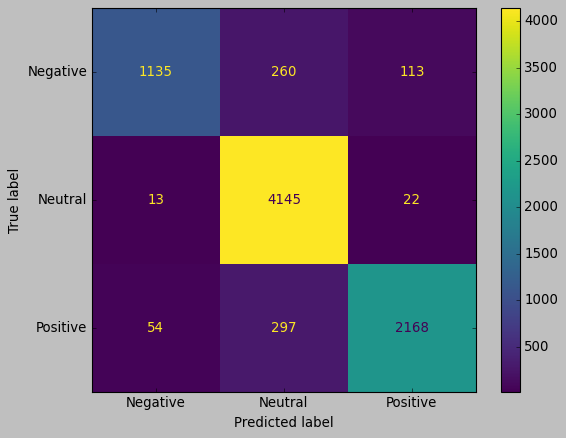

In [203]:
style.use('classic')
cm = confusion_matrix(y_test, logreg_pred, labels=logreg.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels=logreg.classes_)
disp.plot()

In [207]:
# In this section, we used data from Twitter again, but this time we extracted on our own.

In [211]:
import tweepy
from textblob import TextBlob


consumer_key = "6HV0BM0S5dAaGVj7YielaeKEm"
consumer_secret = "bC6CeA970JRQPOX0F08Gm0XP0KeHcH0ZgcwQqej7h3qJBcpjPO"
access_token = "909312012538216448-wWyA3fZqA2PFQjrjbukQ9a89vbI5SqK"
access_token_secret = "kfn8KHka1ETbDlHmR0h7deqLHleFdkToUcAlptoGjEWul"

auth = tweepy.OAuth1UserHandler(consumer_key, consumer_secret, access_token, access_token_secret)
api = tweepy.API(auth)



# Set up a search query for tweets about GHG emissions
query = "greenhouse gas -filter:retweets -filter:links exclude:carbon"

# Use the search_tweets function to gather a dataset of tweets
tweet_data = []
for tweet in tweepy.Cursor(api.search_tweets, q=query, lang="en", tweet_mode="extended").items(100):
    tweet_data.append(tweet)

# Tokenize the tweets to extract the words
words = []
for tweet in tweet_data:
    text = TextBlob(tweet.full_text)
    words.extend(text.words)

# Create a dictionary to map words to counts
word_counts = {}

# Iterate over the words
for word in words:
    if word in word_counts:
        word_counts[word] += 1
    else:
        word_counts[word] = 1

# Sort the dictionary by value in descending order
sorted_counts = sorted(word_counts.items(), key=lambda x: x[1], reverse=True)

# Print the top 10 words
for i in range(min(10, len(sorted_counts))):
    print(f"{sorted_counts[i][0]}: {sorted_counts[i][1]} occurrences")

In [212]:
# Most retweeted tweet.

In [213]:
# Authenticate your application with the Twitter API
auth = tweepy.OAuth1UserHandler(consumer_key, consumer_secret, access_token, access_token_secret)
api = tweepy.API(auth)

# Set up a search query for tweets about GHG emissions
query = "greenhouse gas"

# Use the search_tweets function to gather a dataset of tweets
tweet_data = []
for tweet in tweepy.Cursor(api.search_tweets, q=query, lang="en", result_type="popular", tweet_mode="extended").items(100):
    tweet_data.append(tweet)

# Sort the tweets by retweet count in descending order
sorted_tweets = sorted(tweet_data, key=lambda x: x.retweet_count, reverse=True)

# Print the most popular tweet
print(f"Most popular tweet: {sorted_tweets[0].full_text}")
print(f"Retweet count: {sorted_tweets[0].retweet_count}")

Most popular tweet: Jordan Peterson has uncovered our evil plan to improve air quality, reduce road deaths, reduce greenhouse gas emissions from cars, support businesses, and resurrect the rich social lives of our cities.

Here's the 'dystopia' he's is talking about...🤔 https://t.co/THG3EekfkQ https://t.co/S3ppLfOCzh
Retweet count: 211


In [214]:
# Most recent 5 tweets.

In [216]:
# Authenticate your application with the Twitter API
auth = tweepy.OAuth1UserHandler(consumer_key, consumer_secret, access_token, access_token_secret)
api = tweepy.API(auth)

# Set up a search query for tweets about GHG emissions
query = "greenhouse gas emissions"

# Use the search_tweets function to gather a dataset of tweets
tweet_data = []
for tweet in tweepy.Cursor(api.search_tweets, q=query, lang="en", tweet_mode="extended").items(5):
    tweet_data.append(tweet)

# Print the text of each tweet
for tweet in tweet_data:
    print(tweet.full_text)

RT @UNFCCC: The way we produce, eat and waste food is one of the largest drivers of climate change, with food production responsible for a…
2. Help the environment: Solar energy is a clean, renewable energy source that doesn't produce greenhouse gas emissions or other pollutants. By going solar, you can reduce your carbon footprint and help combat climate change.
Manufacturing, notably low-cost construction materials like steel and cement, accounts for around one-third of global greenhouse gas emissions. As a result, manufacturing emits more pollution than the energy or transportation industries.
#ClimateScience #ClimateCrisis
RT @SecVilsack: In 2022, @POTUS delivered an ambitious slate of actions to lower costs for families, boost U.S. energy security, and reduce…
Why #greenhousegases #emissions needs to be cut to #Zero. 
@Yale study reveals effect of increasing greenhouse gas #emissions on intensifying atmospheric rivers, and extreme precipitation https://t.co/xBCPghPWbv #heavyrain #

In [ ]:
# Climate change and greenhouse emissions tweets.

In [217]:
# Authenticate your application with the Twitter API
auth = tweepy.OAuth1UserHandler(consumer_key, consumer_secret, access_token, access_token_secret)
api = tweepy.API(auth)

# Set up a search query for tweets about GHG emissions
query = "climate change and greenhouse gas"

# Use the search_tweets function to gather a dataset of tweets
tweet_data = []
for tweet in tweepy.Cursor(api.search_tweets, q=query, lang="en", tweet_mode="extended").items(1):
    tweet_data.append(tweet)

# Print the screen names and text of each tweet
for tweet in tweet_data:
    print(f"@{tweet.user.screen_name}: {tweet.full_text}")

@InLagging: RT @UNFCCC: The way we produce, eat and waste food is one of the largest drivers of climate change, with food production responsible for a…


In [ ]:
# In this section, we plot some data of different types of gases.

In [177]:
by_category  = df_global_greenhousegas.groupby(['category'])

In [178]:
category_count = by_category.count()

In [179]:
short_category = ["co2","ghg(indirect co2)","ghg","hfc+pfc","hfc","ch4","nf3","n2o","pfc","sf6"]
category_count["Shorted_category"] = short_category

,country_or_area,year,value,Shorted_category
category,,,,
CO2 Emissions without Land Use,1074,1074,1074,co2
Greenhouse Gas Emissions including Indirect CO2,949,949,949,ghg(indirect co2)
Greenhouse Gas Emissions without Land Use,1074,1074,1074,ghg
HFCS and PCFS mix,75,75,75,hfc+pfc
Hydrofluorocarbon Emissions,975,975,975,hfc
Methane CH4 Emissions without Land Use,1074,1074,1074,ch4
N2O Emissions,1074,1074,1074,nf3
NF3 Emissions,248,248,248,n2o
PCFS Emissions,831,831,831,pfc


In [181]:
trying_emission = df_global_greenhousegas

In [183]:
replaced_emission = trying_emission.replace(to_replace=["CO2 Emissions without Land Use",
                                                        "Greenhouse Gas Emissions including CO2 Indirect",
                                                        "Greenhouse Gas Emissions without Land Use",
                                                        "Hydrofluorocarbon Emissions",
                                                        "Methane CH4 Emissions without Land Use",
                                                        "NF3 Emissions",
                                                        "N2O Emissions",
                                                        "PCFS Emissions",
                                                        "SF6 Emissions",
                                                        "HFCS and PCFS mix"
                                                        ], value = ["CO2","GHG_IndirectCO2","GHG","HFC","CH4","NF3","N2O","PFC","SF6","HFC+PFC"])

d=replaced_emission.groupby(["category"],as_index=False)

In [185]:
data_div = pd.pivot_table(replaced_emission,values="value",index = ["country_or_area", "year"],columns = ["category"])

In [186]:
gases = data_div.columns.values

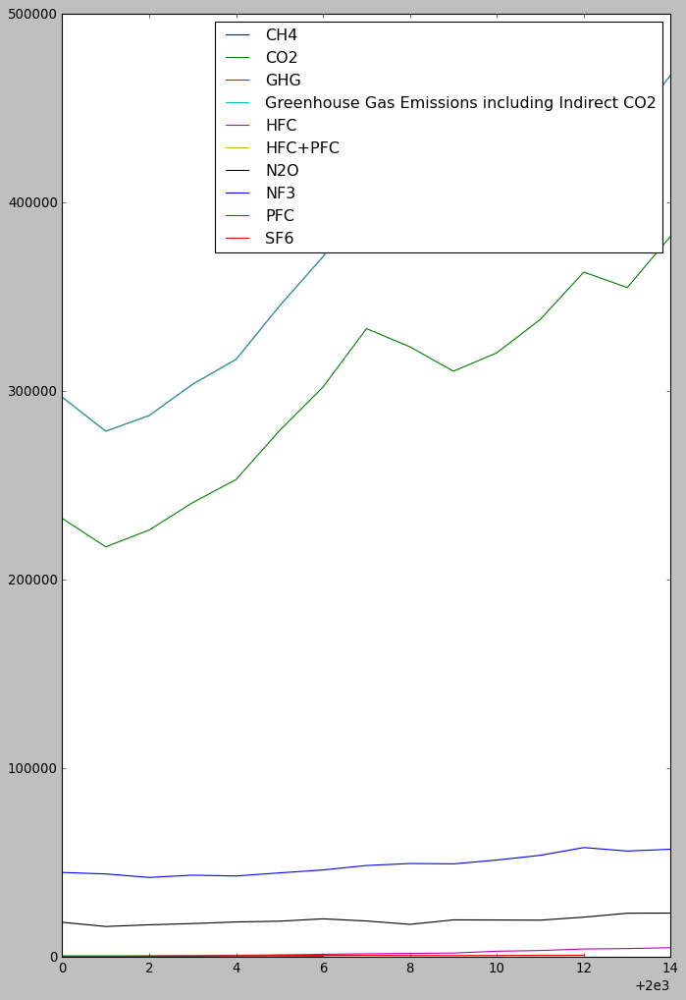

In [201]:
def plot_the_country(name):
    find = data_div.loc[name]
    plt.plot(find)
    plt.legend(gases)
    plt.tick_params(labelsize=12)
    plt.xlim(2000,2014)
    
    
plot_the_country("Turkey")

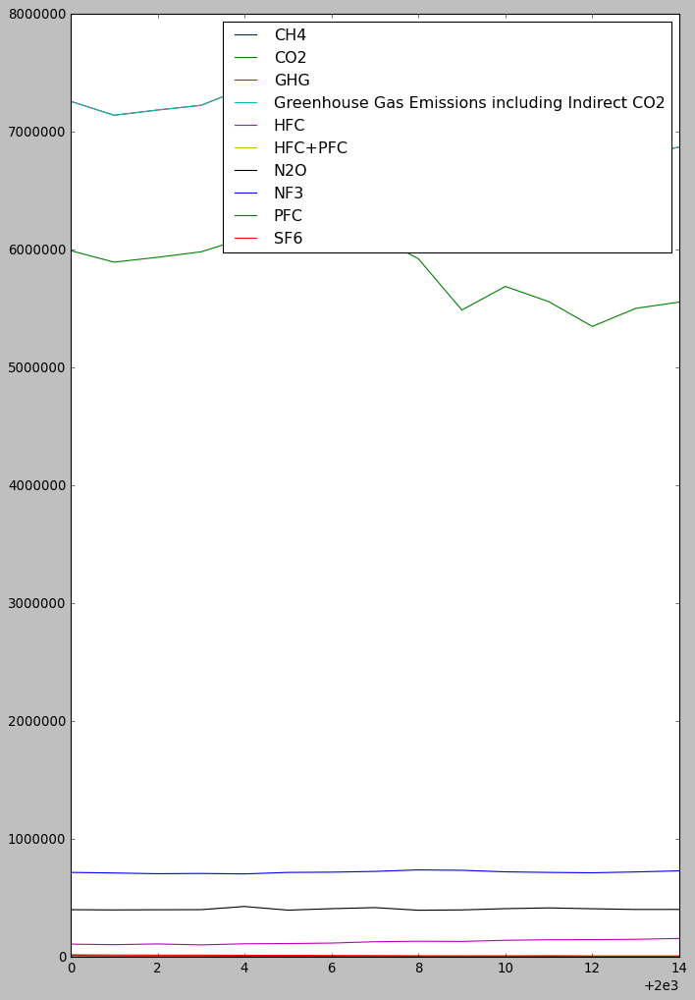

In [200]:
plot_the_country("United States of America")

In [202]:
area_div = pd.pivot_table(replaced_emission, values='value', index=['category', 'year'], columns=['country_or_area'])

In [203]:
countries = area_div.columns.values

In [204]:
def country_wise_plot(name):
    cname = area_div.loc[name]
    plt.plot(cname)
    plt.tick_params(labelsize=14)
    plt.legend(countries, loc = "center left",bbox_to_anchor=(1, 0.5),fontsize = 18,ncol = 3)
    plt.rcParams["figure.figsize"] = [15, 10]

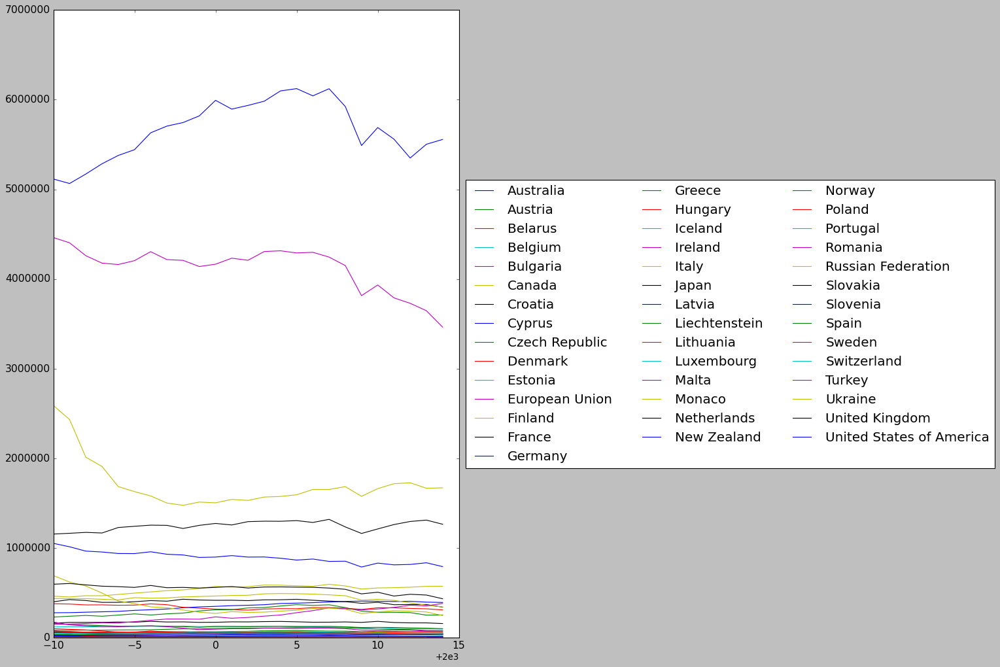

In [205]:
# co2 gases 
country_wise_plot(gases[1])

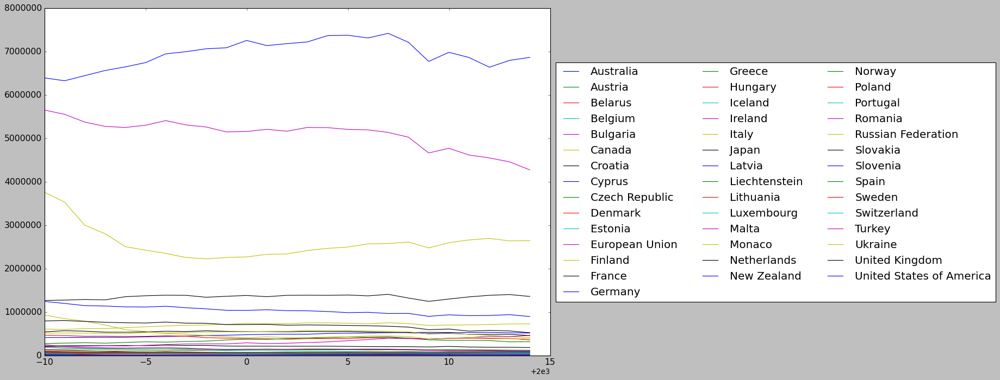

In [206]:
# ghs total gases 
country_wise_plot(gases[2])

In [ ]:
# Greenhouses gases linear regression

In [208]:
data_co2_gases_america=data_co2_gases[data_co2_gases["country_or_area"]=="United States of America"]
data_co2_gases_america

,country_or_area,year,value,category
1049,United States of America,2014,5.556007e+06,CO2 Emissions without Land Use
1050,United States of America,2013,5.502551e+06,CO2 Emissions without Land Use
1051,United States of America,2012,5.349221e+06,CO2 Emissions without Land Use
1052,United States of America,2011,5.559508e+06,CO2 Emissions without Land Use
1053,United States of America,2010,5.688756e+06,CO2 Emissions without Land Use
1054,United States of America,2009,5.488320e+06,CO2 Emissions without Land Use
1055,United States of America,2008,5.923201e+06,CO2 Emissions without Land Use
1056,United States of America,2007,6.121654e+06,CO2 Emissions without Land Use
1057,United States of America,2006,6.042394e+06,CO2 Emissions without Land Use
1058,United States of America,2005,6.122747e+06,CO2 Emissions without Land Use


In [209]:
from sklearn.linear_model import LinearRegression


model = LinearRegression()

X = data_co2_gases_america[["year"]]
y = data_co2_gases_america["value"]

model.fit(X, y)

prediction = model.predict([[2100]])[0]


prediction

/Users/so/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names



7430295.383827172

In [ ]:
#  Random Forest Classifier for  CH4

In [218]:
import pandas as pd
!pip install graphviz
import graphviz
from sklearn import tree

In [219]:
data_ch4_gases_1=data_ch4_gases.drop('category', axis=1)
data_ch4_gases_1

,country_or_area,year,value
4072,Australia,2014,98076.109401
4073,Australia,2013,99857.204626
4074,Australia,2012,100796.838744
4075,Australia,2011,101085.537857
4076,Australia,2010,99447.730159
...,...,...,...
5141,United States of America,1994,770450.426146
5142,United States of America,1993,764089.671267
5143,United States of America,1992,776869.789752
5144,United States of America,1991,777034.220915


In [220]:
data_X = data_ch4_gases_1.drop('country_or_area', axis=1)
data_y = data_ch4_gases_1['country_or_area']
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(data_X, data_y, test_size=0.25, random_state=50)

In [221]:
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(criterion="gini",
                           n_estimators=10,
                            random_state=5)

In [222]:
clf = clf.fit(X_train, y_train)

In [223]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score

predictions = clf.predict(X_test)

In [224]:
#accuracy_score
accuracy_score(y_test, predictions)

0.2527881040892193

In [225]:
# recall_score
recall_score(y_test,predictions,average="weighted")

0.2527881040892193

In [226]:
# precision_score
precision_score(y_test, predictions, average="weighted")

/Users/so/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



0.23850987921619893

In [227]:
# f1_score

f1_score(predictions,y_test, average="weighted")

0.26771915721988804

In [228]:
from sklearn.metrics import classification_report, confusion_matrix
print(confusion_matrix(y_test, predictions))
print(classification_report(y_test, predictions))

[[2 0 0 ... 4 3 0]
 [0 1 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [2 0 0 ... 2 2 0]
 [3 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 3]]
                          precision    recall  f1-score   support

               Australia       0.22      0.20      0.21        10
                 Austria       0.08      0.17      0.11         6
                 Belarus       0.00      0.00      0.00         2
                 Belgium       0.20      0.10      0.13        10
                Bulgaria       0.00      0.00      0.00         6
                  Canada       0.50      0.33      0.40         3
                 Croatia       0.38      0.60      0.46         5
                  Cyprus       1.00      0.80      0.89         5
          Czech Republic       0.20      0.20      0.20         5
                 Denmark       0.00      0.00      0.00         8
                 Estonia       0.86      1.00      0.92         6
          European Union       0.50      1.00      0.67         4
                 Finl

/Users/so/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/so/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/so/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



random number : 2


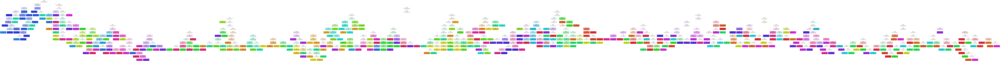

In [232]:
from random import *
rand = randint(1, 5)
print("random number :" ,rand)

from sklearn.tree import export_graphviz
estimator = clf.estimators_[rand]
# Export as dot file
dot_data = export_graphviz(estimator, 
                         #  feature_names=["country_or_area","year","value","category"],
                      #     class_names=wine.target_names, 
                           filled=True, impurity=True, 
                           rounded=True)

graph = graphviz.Source(dot_data, format='png')
graph